In [5]:
import os
import torch
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
from sklearn.metrics import classification_report
from torch import Tensor
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import torch.nn.functional as F
from PIL import Image
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import normalize, resize, to_tensor, to_pil_image

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Specify directories
#train_dir = "./Training"
#test_dir = "./Testing"

train_dir = "../data/Training"
test_dir = "../data/Testing"
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

img_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),

])


In [12]:
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)
test_imgs = datasets.ImageFolder(root=test_dir, transform=img_transform)


# Split train dataset into training and validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

In [14]:
def load_vit_model(path = '/temp/tumor-detection/checkpoints/vit/vit_finetuned_full.pth'):
    #vit_model = models.vision_transformer.vit_b_16(pretrained=True)
    #for param in vit_model.parameters():
        #param.requires_grad = False
    #num_features = vit_model.heads[0].in_features  # Access the in_features correctly
    #vit_model.heads = nn.Linear(num_features, 4)  # Replace with a new classifier for 4 classes
    #vit_checkpoint = torch.load(os.path.expanduser('~') + path, weights_only = False)
    vit_model = torch.load(os.path.expanduser('~') + path)
    #vit_model.load_state_dict(vit_checkpoint)
    print("ViT model loaded!")
    vit_model = vit_model.to(device)
    return vit_model

def load_resnet_model(path = '/temp/tumor-detection/checkpoints/resnet/resnet_full.pth'):
    #base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
    #base_model.trainable = False  # Freeze the base model
    # Add custom classification head
    #x = base_model.output
    #x = GlobalAveragePooling2D()(x)
    #x = Dense(256, activation="relu")(x)
    #x = Dense(4, activation="softmax")(x)  # Adjust for your number of classes
    #model = Model(inputs=base_model.input, outputs=x)
    # Compile the model
    #model.compile(
        #optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        #loss="categorical_crossentropy",
        #metrics=["accuracy"]
    #)
    resnet_model = torch.load(os.path.expanduser('~') + path)
    print("ResNet finetuned weights loaded!")
    return resnet_model




def load_efficientnet_model(path = '/temp/tumor-detection/checkpoints/efficientnet/efficientnet_full.pth'):
    #efficientnet_model = models.efficientnet_b0(pretrained=True)
    efficientnet_model = torch.load(os.path.expanduser('~') + path)
    #for param in efficientnet_model.parameters():
        #param.requires_grad = False
    #num_features = efficientnet_model.classifier[1].in_features
    #efficientnet_model.classifier[1] = nn.Linear(num_features, 4)  # 4 classes
    #print(enet_checkpoint)
    #efficientnet_model.load_state_dict(enet_checkpoint)
    print("EfficientNet finetuned weights loaded!")
    efficientnet_model.to(device)
    return efficientnet_model

In [16]:
vit_model = load_vit_model()
resnet_model = load_resnet_model()
efficientnet_model = load_efficientnet_model()

C:\Users\moham\AppData\Local\Temp\ipykernel_27308\2463444830.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vit_model = torch.load(os.path.expanduser('~') + path)


ViT model loaded!
ResNet finetuned weights loaded!
EfficientNet finetuned weights loaded!


C:\Users\moham\AppData\Local\Temp\ipykernel_27308\2463444830.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet_model = torch.load(os.path.expanduser('~') + path)
C

False


In [352]:
resnet_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [17]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
optimizer = optim.Adam(vit_model.heads.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()


In [18]:
all_preds = {}
all_labels = {}
test_correct = {}
test_total = {}
all_preds["efficientnet"] = []
all_preds["vit"] = []
all_preds["resnet"] = []
all_labels["efficientnet"] = []
all_labels["vit"] = []
all_labels["resnet"] = []
test_correct["efficientnet"] = 0
test_correct["vit"] = 0
test_correct["resnet"] = 0
test_total["efficientnet"] = 0
test_total["vit"] = 0
test_total["resnet"] = 0


In [19]:
all_preds["efficientnet"]  = []
all_labels["efficientnet"] = []
test_correct["efficientnet"] = 0
test_total["efficientnet"] = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = efficientnet_model(images)
        _, predicted = torch.max(outputs, 1)
        test_total["efficientnet"] += labels.size(0)
        test_correct["efficientnet"] += (predicted == labels).sum().item()

        # Store predictions and labels for classification report
        all_preds["efficientnet"].extend(predicted.cpu().numpy())
        all_labels["efficientnet"].extend(labels.cpu().numpy())

# Calculate accuracy
enet_correct = test_correct["efficientnet"]
enet_total = test_total["efficientnet"]
print(f"EfficientNet Test Accuracy: {100 * enet_correct / enet_total:.2f}%")

EfficientNet Test Accuracy: 91.38%


In [20]:
all_preds["resnet"]  = []
all_labels["resnet"] = []
test_correct["resnet"] = 0
test_total["resnet"] = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = resnet_model(images)
        _, predicted = torch.max(outputs, 1)
        test_total["resnet"] += labels.size(0)
        test_correct["resnet"] += (predicted == labels).sum().item()

        # Store predictions and labels for classification report
        all_preds["resnet"].extend(predicted.cpu().numpy())
        all_labels["resnet"].extend(labels.cpu().numpy())

# Calculate accuracy
resnet_correct = test_correct["resnet"]
resnet_total = test_total["resnet"]
print(f"ResNet Test Accuracy: {100 * resnet_correct / resnet_total:.2f}%")

ResNet Test Accuracy: 87.64%


In [21]:
all_preds["vit"]  = []
all_labels["vit"] = []
test_correct["vit"] = 0
test_total["vit"] = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = vit_model(images)
        _, predicted = torch.max(outputs, 1)
        test_total["vit"] += labels.size(0)
        test_correct["vit"] += (predicted == labels).sum().item()

        # Store predictions and labels for classification report
        all_preds["vit"].extend(predicted.cpu().numpy())
        all_labels["vit"].extend(labels.cpu().numpy())

# Calculate accuracy
vit_correct = test_correct["vit"]
vit_total = test_total["vit"]
print(f"ViT Test Accuracy: {100 * vit_correct / vit_total:.2f}%")

ViT Test Accuracy: 93.36%


In [24]:
class gradcam:
    def __init__(self, model: nn.Module, conv_layer: str) -> None:
        self.submodule_dict = dict(model.named_modules())
        if conv_layer not in self.submodule_dict.keys():
            raise ValueError(f"Unable to find submodule {conv_layer} in the model")

        self.model = model
        self.hook_handles = []
        self.hook_a, self.hook_g = None, None
        self.hook_handles.append(self.submodule_dict[conv_layer].register_forward_hook(self._hook_a))
        self.hook_handles.append(self.submodule_dict[conv_layer].register_backward_hook(self._hook_g))
        self._hooks_enabled = True

    def _hook_a(self, module: nn.Module, input: Tensor, output: Tensor) -> None:
        """Activation hook"""
        if self._hooks_enabled:
            self.hook_a = output.data

    def _hook_g(self, module: nn.Module, input: Tensor, output: Tensor) -> None:
        """Gradient hook"""
        if self._hooks_enabled:
            self.hook_g = output[0].data

    def clear_hooks(self) -> None:
        for handle in self.hook_handles:
            handle.remove()

    def _backprop(self, scores: Tensor, class_idx: int) -> None:
        """Backpropagate the loss for a specific output class"""
        if self.hook_a is None:
            raise TypeError("Inputs need to be forwarded in the model for the conv features to be hooked")

        loss = scores[:, class_idx].sum()
        self.model.zero_grad()
        loss.backward(retain_graph=True)

    def _get_weights(self, class_idx: int, scores: Tensor) -> Tensor:
        """Computes the weight coefficients of the hooked activation maps"""
        self.hook_g: Tensor
        self._backprop(scores, class_idx)
        return self.hook_g.squeeze(0).mean(dim=(1, 2))

    def __call__(self, class_idx: int, scores: Tensor = None, normalized: bool = True) -> Tensor:
        self._precheck(class_idx, scores)
        return self.compute_cams(class_idx, scores, normalized)

    def compute_cams(self, class_idx: int, scores: Tensor = None, normalized: bool = True) -> Tensor:
        weights = self._get_weights(class_idx, scores)
        batch_cams = (weights.view(*weights.shape, 1, 1) * self.hook_a.squeeze(0)).sum(0)
        batch_cams = F.relu(batch_cams, inplace=True)
        if normalized:
            batch_cams = self._normalize(batch_cams)
        return batch_cams

    def _precheck(self, class_idx: int, scores: Tensor = None) -> None:
        """Check for invalid computation cases"""
        if not isinstance(self.hook_a, Tensor):  # Check that forward has already occurred
            raise AssertionError("Inputs need to be forwarded in the model for the conv features to be hooked")
        if self.hook_a.shape[0] != 1:  # Check batch size
            raise ValueError(f"expected a 1-sized batch to be hooked. Received: {self.hook_a.shape[0]}")
        if class_idx < 0:  # Check class_idx value
            raise ValueError("Incorrect `class_idx` argument value")
        if not isinstance(scores, torch.Tensor):  # Check scores arg
            raise ValueError("model output scores is required to be passed to compute CAMs")

    @staticmethod
    def _normalize(cams: Tensor) -> Tensor:
        cams.sub_(cams.flatten(start_dim=-2).min(-1).values.unsqueeze(-1).unsqueeze(-1))
        cams.div_(cams.flatten(start_dim=-2).max(-1).values.unsqueeze(-1).unsqueeze(-1))
        return cams


In [25]:
def gradcam_activation_efficientnet(idx, model):
    gc = gradcam(efficientnet_model, 'features.8')
    img_tensor = test_dataset[idx][0].unsqueeze(0)
    img_tensor.requires_grad = True
    output = efficientnet_model(img_tensor)
    class_idx = output.squeeze(0).argmax(0).item()
    #print((test_imgs[1][1], class_idx1))
    act_map = gc(class_idx = class_idx, scores = output).cpu()
    return act_map

def gradcam_activation_cnn(idx, model, layer_name):
    gc = gradcam(model, layer_name)
    img_tensor = test_dataset[idx][0].unsqueeze(0)
    img_tensor.requires_grad = True
    output = model(img_tensor)
    class_idx = output.squeeze(0).argmax(0).item()
    #print((test_imgs[1][1], class_idx1))
    act_map = gc(class_idx = class_idx, scores = output).cpu()
    return act_map

def heatmap_combination(idx, act_map):
    img = to_pil_image(test_imgs[idx][0])
    heatmap = to_pil_image(act_map, mode = 'F')
    result = overlay_mask(img, heatmap)
    return result, heatmap

[0, 1, 2, 3, 5, 6]


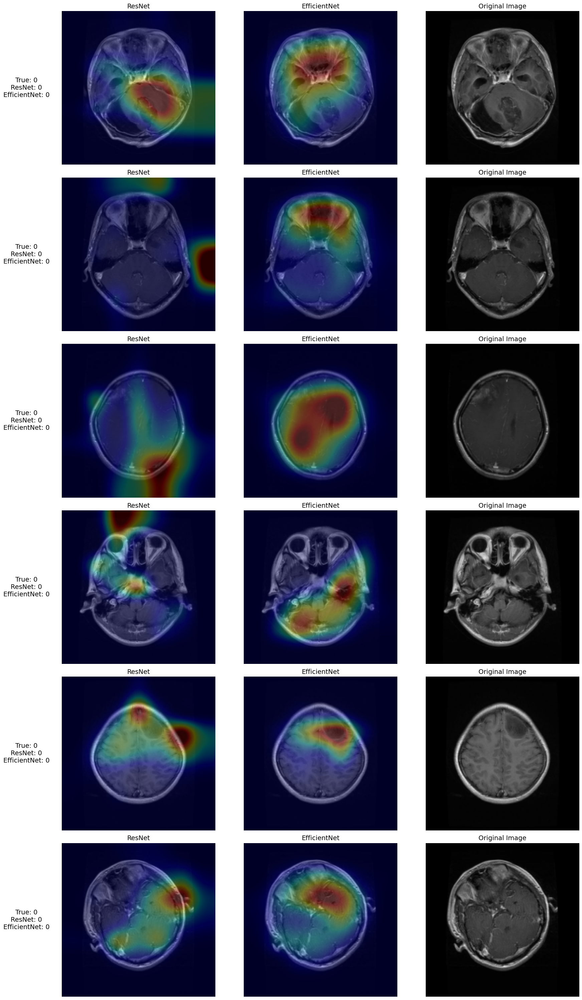

In [93]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if  all_labels['resnet'][i] == 0 and all_preds['efficientnet'][i] == all_labels['resnet'][i] and all_preds['resnet'][i] == all_labels['resnet'][i]:
    #if  all_labels['resnet'][i] != 0 and all_preds['efficientnet'][i] == all_labels['resnet'][i] and all_preds['resnet'][i] != all_labels['resnet'][i]:
    #if all_labels['resnet'][i] != 0 and all_preds['efficientnet'][i] == all_labels['resnet'][i] and all_preds['resnet'][i] == 0:
    #if all_labels['resnet'][i] != 0 and all_preds['resnet'][i] == all_labels['resnet'][i] and all_preds['efficientnet'][i] == 0:
    #if all_labels['resnet'][i] == 0 and all_preds['resnet'][i] != 0 and all_preds['efficientnet'][i] == 0:
    #if all_labels['resnet'][i] == 0 and all_preds['resnet'][i] == 0 and all_preds['efficientnet'][i] != 0:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()


[301, 302, 304, 307, 311, 313]


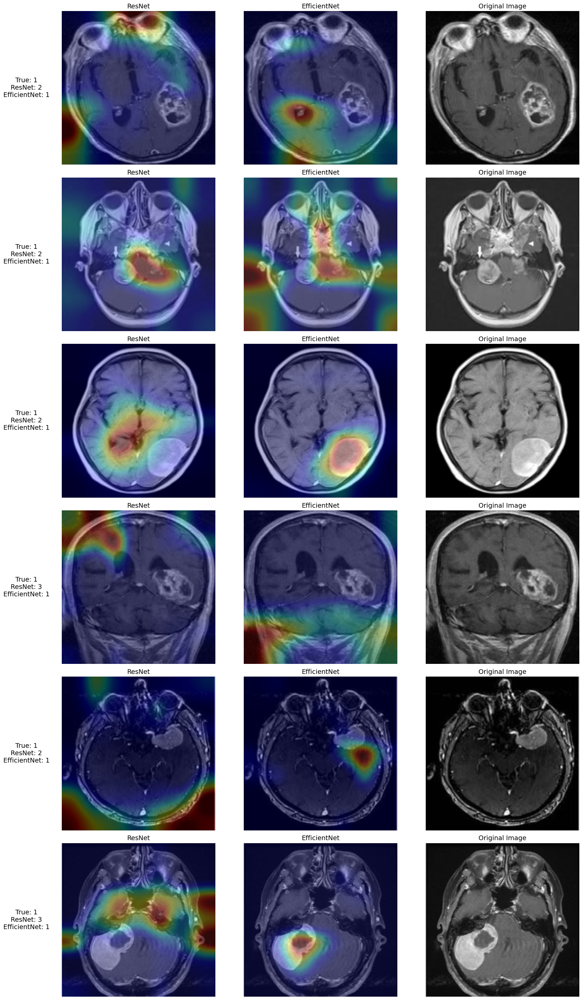

In [94]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if  all_labels['resnet'][i] != 0 and all_preds['efficientnet'][i] == all_labels['resnet'][i] and all_preds['resnet'][i] != all_labels['resnet'][i]:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()


[366, 380, 396, 402, 415, 418]


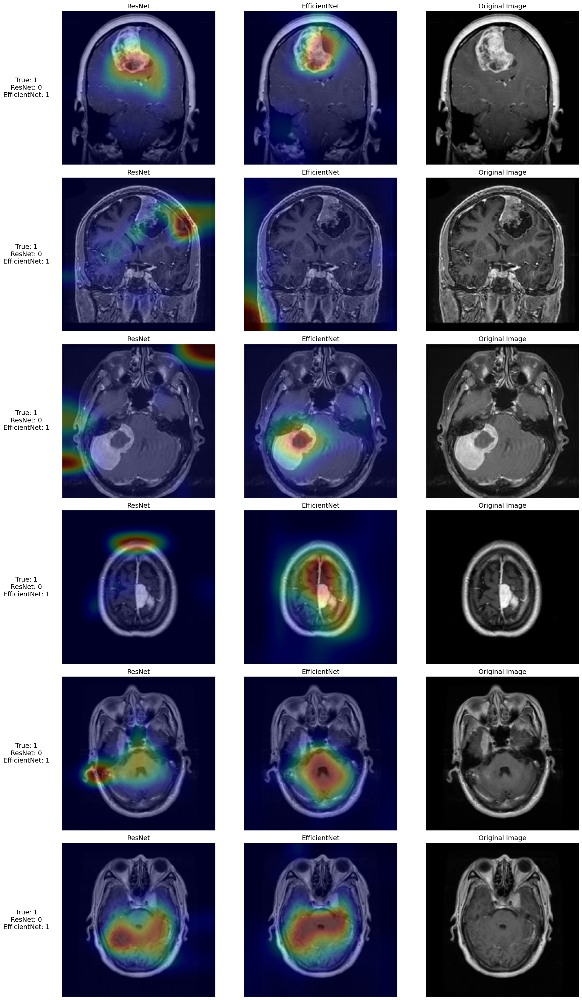

In [95]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if all_labels['resnet'][i] != 0 and all_preds['efficientnet'][i] == all_labels['resnet'][i] and all_preds['resnet'][i] == 0:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()


[487, 504, 553, 605, 1006]


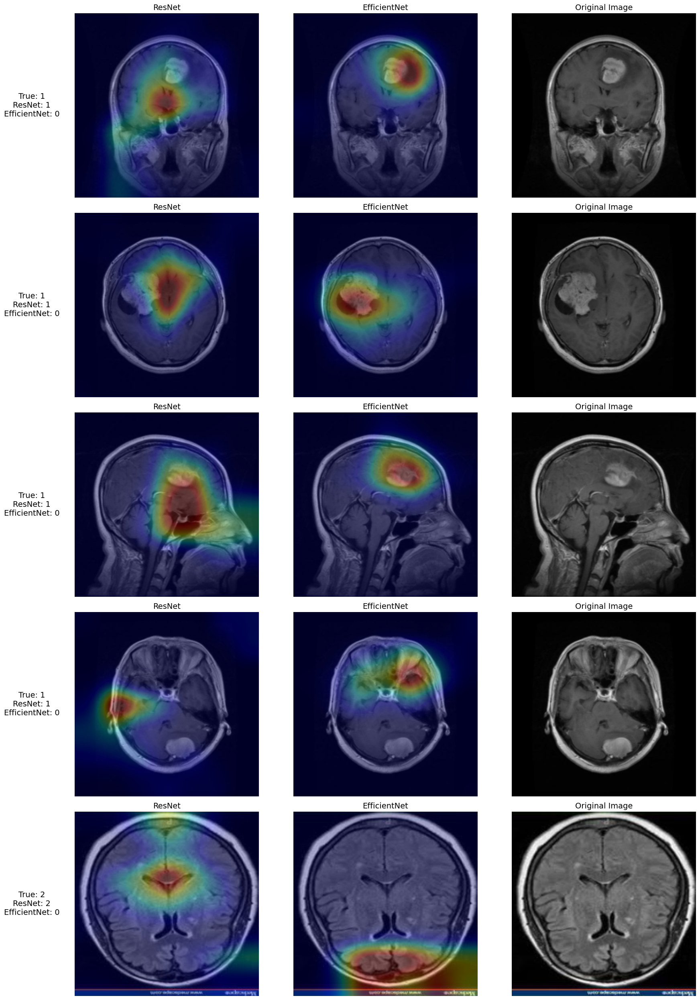

In [ ]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if all_labels['resnet'][i] != 0 and all_preds['resnet'][i] == all_labels['resnet'][i] and all_preds['efficientnet'][i] == 0:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()


[4, 20, 57, 94, 107, 110]


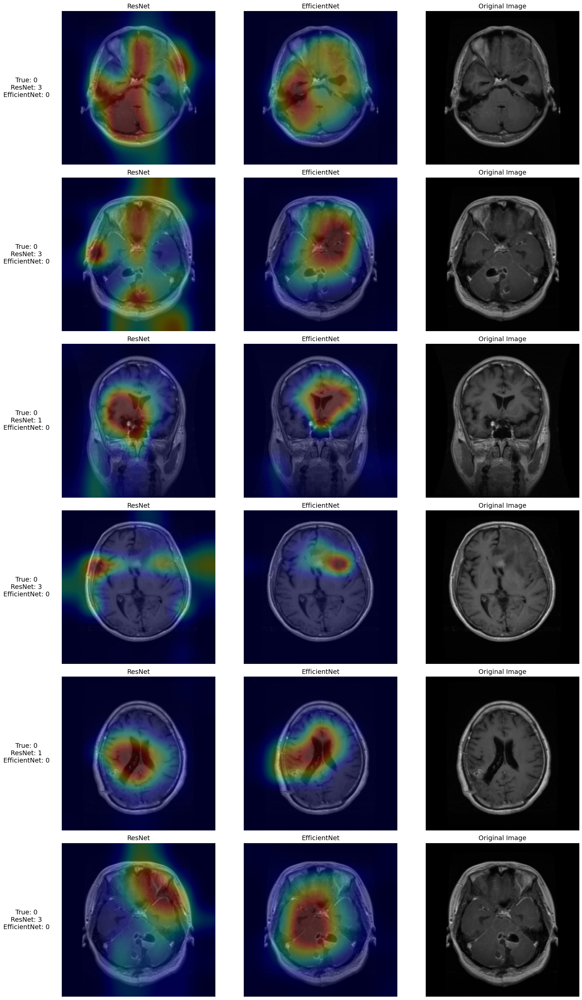

In [ ]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if all_labels['resnet'][i] == 0 and all_preds['resnet'][i] != 0 and all_preds['efficientnet'][i] == 0:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()


[19, 24, 29, 46, 152, 162]


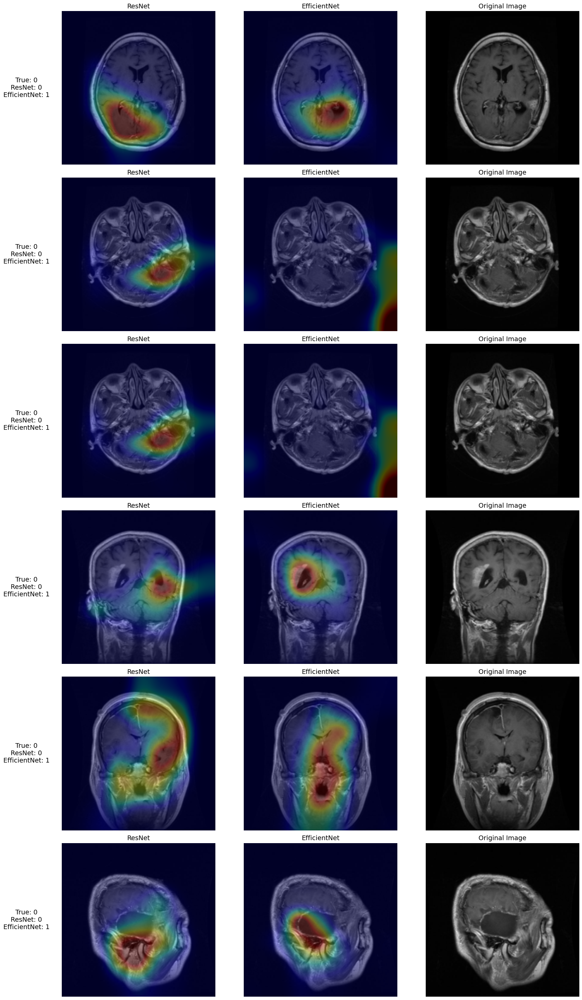

In [98]:
t1idx = 100
Indices = []
count = 0

# Identify indices meeting the criteria
for i in range(0, len(all_preds['resnet'])):
    if all_labels['resnet'][i] == 0 and all_preds['resnet'][i] == 0 and all_preds['efficientnet'][i] != 0:
        if count > 5:
            break
        Indices.append(i)
        count += 1

print(Indices)

# Initialize variables for the grid
num_images = len(Indices)
fig, axes = plt.subplots(num_images, 4, figsize=(18, 5 * num_images), 
                         gridspec_kw={'width_ratios': [1, 5, 5, 5]})  # Adjust column widths

if num_images == 1:  # Handle single index case
    axes = [axes]

# Loop through indices and populate the grid
for i, x in enumerate(Indices):
    # ResNet image
    disp_idx2 = x
    act2_resnet = gradcam_activation_cnn(disp_idx2, resnet_model, 'layer4.2.conv3')
    res2_resnet, ht2_resnet = heatmap_combination(disp_idx2, act2_resnet)

    # EfficientNet image
    disp_idx1 = x
    act1_efficientnet = gradcam_activation_cnn(disp_idx1, efficientnet_model, 'features.8.0')
    res1_efficientnet, ht1_efficientnet = heatmap_combination(disp_idx1, act1_efficientnet)

    # Original image
    original_img = to_pil_image(test_imgs[x][0])

    # Generate row label text
    true_label = all_labels['resnet'][x]
    resnet_pred = all_preds['resnet'][x]
    efficientnet_pred = all_preds['efficientnet'][x]
    row_label = f"True: {true_label}\nResNet: {resnet_pred}\nEfficientNet: {efficientnet_pred}"

    # Add label as text in the first column
    axes[i][0].text(0.5, 0.5, row_label, ha='center', va='center', fontsize=14, wrap=True)
    axes[i][0].axis('off')  # Hide axis for label column

    # Titles and images for the other columns
    titles = ['ResNet', 'EfficientNet', 'Original Image']
    images = [res2_resnet, res1_efficientnet, original_img]

    for ax, img, title in zip(axes[i][1:], images, titles):  # Start from the second column
        ax.imshow(img)
        ax.set_title(title, fontsize=14)
        ax.axis('off')  # Hide axes

# Adjust layout and save the combined figure
plt.tight_layout()
plt.savefig('combined_images_with_thin_labels_column.png', dpi=300)  # Save the figure as a PNG file
plt.show()
